In [3]:
import pandas as pd
import numpy as np
import sys
from joblib import Parallel, delayed
sys.path.append('/mydata/watres/quentin/code/FLOW/hourly_analysis/')
import GAMCR
save_folder= '/mydata/watres/quentin/code/FLOW/hourly_analysis/RES_GAMCR/real_data/'
import os
import pickle
import matplotlib.pyplot as plt
all_GISID = [el for el in list(os.walk(save_folder))[0][1] if (not('/' in el) and not('.' in el))]


feat_space, all_GISID, dffeat = GAMCR.dataset.get_feat_space(all_GISID=all_GISID, get_df=True, normalize=False)

dffeat.head()

2,EZG,P_MEAN,P_SUMM,P_WINT,PET_MEAN,PET_SUMM,PET_WINT,H_MIN,H_MAX,H_MEAN,...,sedimentary rocks,total,artificial,other,alluvial,glacial,swamp,debris,landslide,waters
GIS_ID,,,,,,,,,,,,,,,,,,,,,
1,417.8,1184.83,640.17,571.51,766.66,498.39,281.19,440.0,1514.0,721.0,...,13.0,75.9,0.7,3.7,4.7,54.0,3.5,6.0,3.1,0.0
3,443.2,1568.44,889.30,699.59,690.96,449.92,253.27,639.0,2221.0,1070.0,...,17.4,45.3,0.1,0.0,6.6,11.6,3.2,17.1,6.7,0.0
8,380.7,1750.87,958.78,806.26,492.84,327.81,172.78,585.0,4159.0,2038.0,...,49.7,54.8,0.0,0.0,1.5,28.2,0.2,22.3,2.4,0.2
9,88.1,1856.32,1054.06,841.86,589.08,382.82,217.05,769.0,2502.0,1303.0,...,63.7,49.9,0.0,0.0,3.4,24.8,1.8,17.1,2.2,0.6
13,76.0,1314.62,723.95,617.73,753.73,485.87,281.29,466.0,1037.0,652.0,...,0.0,42.0,0.1,7.8,1.5,27.3,1.7,1.8,1.8,0.0


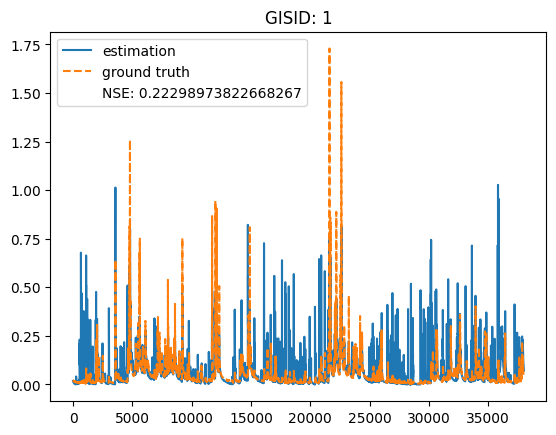

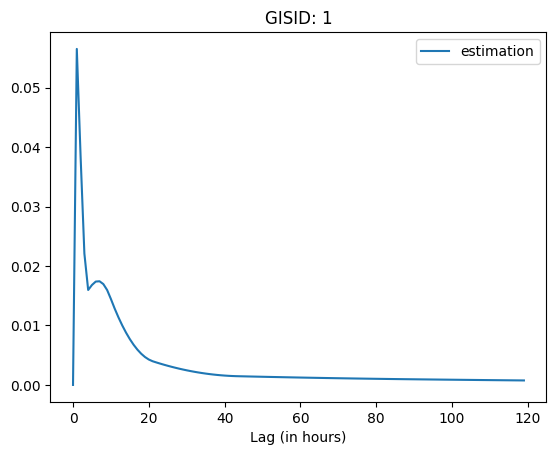

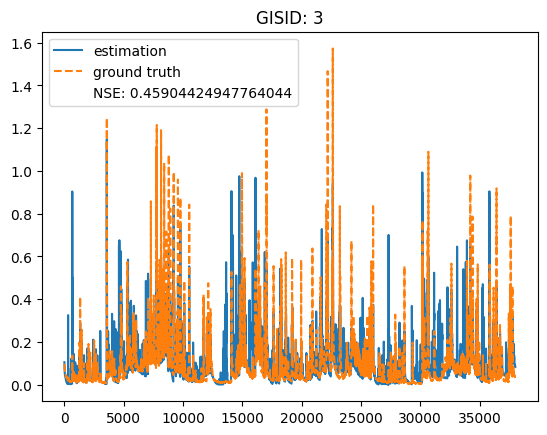

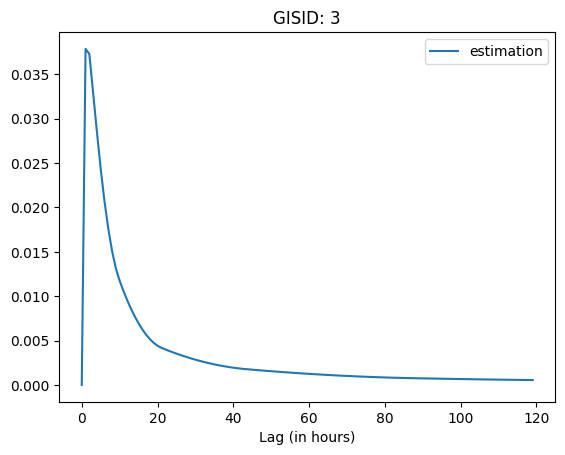

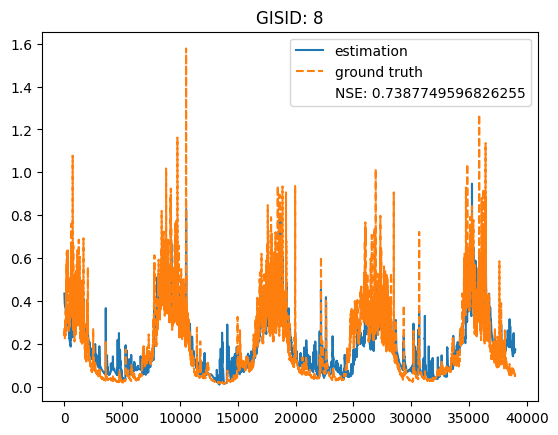

...

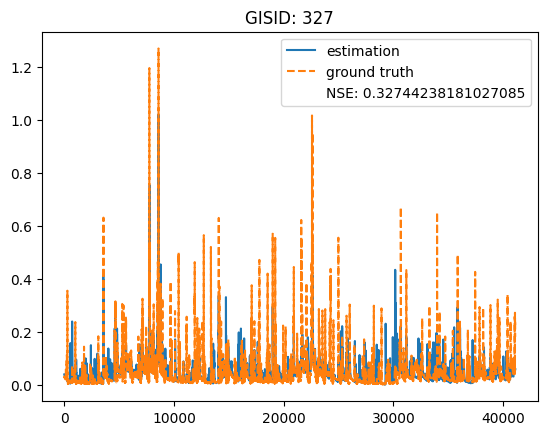

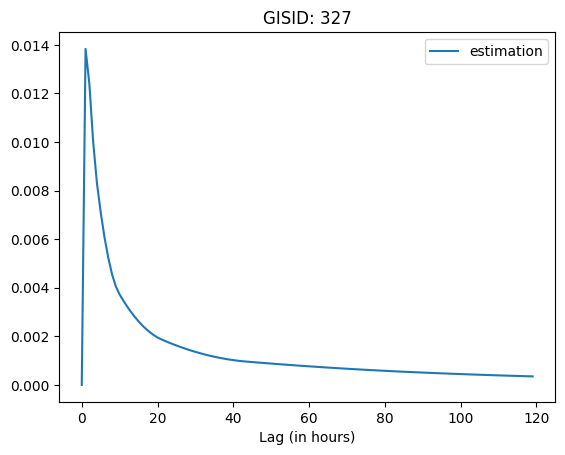

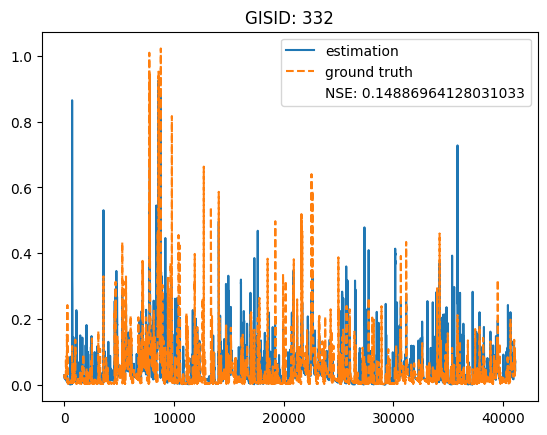

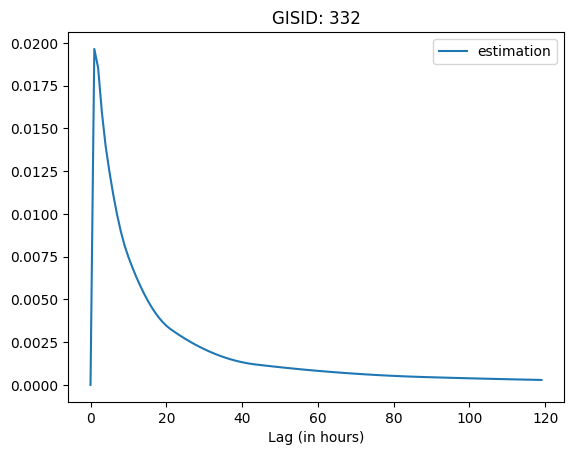

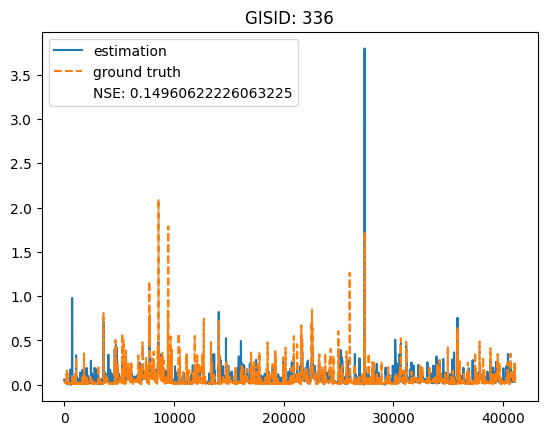

In [ ]:
GISID2NSE = {}
for GISID in all_GISID:
    try:
        model = GAMCR.model.GAMCR(lam=1)
        name_model = '{0}_best_model_all.pkl'.format(GISID)
        save_folder_file =  os.path.join(save_folder,'{0}'.format(GISID))
        model.load_model(os.path.join(save_folder_file, name_model))
        GISIDpath = os.path.join(save_folder, str(GISID), 'data')
        X, matJ, y, timeyear, dates = model.load_data(GISIDpath,  max_files=34)
        coef = 3600 * 1000 / (dffeat.loc[GISID, 'EZG '] * 1000000) 
        y = y * coef
        
        yhat = model.predict_streamflow(matJ)
    
        coeffs = model.gam.get_coeffs().reshape(-1)
        a = np.mean(model.gam._modelmat(X), axis=0)
        smooth_P = np.kron( GAMCR.build_custom_matrix(model.L), np.dot(a.reshape(-1,1), a.reshape(1,-1)) )
    
        SMOOTHNESS = coeffs.T @ smooth_P @ coeffs

        NSE = GAMCR.nse(y,yhat)
        plt.figure()
        plt.plot(yhat, label='estimation')
        plt.plot(y, label='ground truth', linestyle='--')
        plt.title('GISID: ' + str(GISID))
        plt.plot([],[], c='white', label='NSE: {0}'.format(NSE))
        plt.legend()
        plt.show()
        H = model.predict_transfer_function(X)
        plt.figure()
        plt.plot(H.mean(axis=0)[:24*5], label='estimation')
        plt.xlabel('Lag (in hours)')
        plt.title('GISID: ' + str(GISID))
        plt.legend()
        plt.show()
        GISID2NSE[GISID] = NSE
    except:
        pass

with open('/mydata/watres/quentin/code/FLOW/hourly_analysis/RES_GAMCR/real_data_pred/GISID2NSE_all.pkl', 'wb') as handle:
    pickle.dump(GISID2NSE, handle, protocol=pickle.HIGHEST_PROTOCOL)

In [4]:
len(GISID2NSE)

136

In [10]:
NSE_min = 0.3
all_GISID = []
for key, val in GISID2NSE.items():
    if val>=NSE_min:
        all_GISID.append(key)
print(len(all_GISID))

103
